In [15]:
using FITSIO
using RecipesBase
using Statistics
using LinearAlgebra
using Pkg
using Plots

In [16]:
include("1.jl")#this contain lightcurve function and readevent data structures further i will paste only readevent code here for analysis rest of lightcurve code can be found in"https://github.com/kashish2210/notebooks/blob/main/readevent%20with%20rough_calibration%20and%20lightcurve%20(1).ipynb" 

In [6]:
"""
Dictionary of simple conversion functions for different missions
"""
const SIMPLE_CALIBRATION_FUNCS = Dict{String, Function}(
    "nustar" => (pi) -> pi * 0.04 + 1.62,
    "xmm" => (pi) -> pi * 0.001,
    "nicer" => (pi) -> pi * 0.01,
    "ixpe" => (pi) -> pi / 375 * 15,
    "axaf" => (pi) -> (pi - 1) * 14.6e-3
)

"""
Abstract type for mission-specific calibration and interpretation
"""
abstract type AbstractMissionSupport end

"""
Structure containing mission-specific calibration and interpretation information
"""
struct MissionSupport{T} <: AbstractMissionSupport
    name::String
    instrument::Union{String, Nothing}
    epoch::Union{T, Nothing}
    calibration_func::Function
    interpretation_func::Union{Function, Nothing}
end

function get_mission_support(mission::String, 
                           instrument::Union{String, Nothing}=nothing,
                           epoch::Union{Float64, Nothing}=nothing)
    mission_lower = lowercase(mission)
    
    calib_func = if haskey(SIMPLE_CALIBRATION_FUNCS, mission_lower)
        SIMPLE_CALIBRATION_FUNCS[mission_lower]
    else
        throw(ArgumentError("Mission $mission not recognized"))
    end
    
    MissionSupport{Float64}(mission_lower, instrument, epoch, calib_func, nothing)
end

function apply_calibration(mission_support::MissionSupport, pi_channels::AbstractArray{T}) where T
    mission_support.calibration_func.(pi_channels)
end

function patch_mission_info(info::Dict{String,Any}, mission::Union{String,Nothing}=nothing)
    if isnothing(mission)
        return info
    end
    
    mission_lower = lowercase(mission)
    patched_info = copy(info)
    
    if mission_lower == "xmm" && haskey(patched_info, "gti")
        patched_info["gti"] = string(patched_info["gti"], ",GTI0")
    elseif mission_lower == "xte" && haskey(patched_info, "ecol")
        patched_info["ecol"] = "PHA"
        patched_info["ccol"] = "PCUID"
    end
    
    return patched_info
end

function interpret_fits_data!(f::FITS, mission_support::MissionSupport)
    # Placeholder for mission-specific interpretation
    # This would contain mission-specific FITS handling logic
    return nothing
end
#this function is for refrence
function readevents(path::String;
                   mission::Union{String,Nothing}=nothing,
                   instrument::Union{String,Nothing}=nothing,
                   epoch::Union{Float64,Nothing}=nothing,
                   T::Type=Float64,
                   energy_alternatives::Vector{String}=["ENERGY", "PI", "PHA"],
                   sector_column::Union{String,Nothing}=nothing,
                   skip_bitarrays::Bool=true)
    
    # Initialize containers
    headers = Dict{String,Any}[]
    times = T[]
    energies = T[]
    extra_columns = Dict{String, Vector}()
    
    # Get mission support if specified
    mission_support = if !isnothing(mission)
        get_mission_support(mission, instrument, epoch)
    else
        nothing
    end
    
    # Track if we've found the event HDU
    event_hdu_found = false
    
    FITS(path, "r") do f
        # Apply mission-specific interpretation if available
        if !isnothing(mission_support)
            interpret_fits_data!(f, mission_support)
        end
        
        for i = 1:length(f)
            hdu = f[i]
            
            # Always collect headers
            header_dict = Dict{String,Any}()
            for key in keys(read_header(hdu))
                header_dict[string(key)] = read_header(hdu)[key]
            end
            
            # Apply mission-specific patches to header information
            if !isnothing(mission)
                header_dict = patch_mission_info(header_dict, mission)
            end
            push!(headers, header_dict)
            
            # Only process TableHDUs and stop if we've already found the event HDU
            if !event_hdu_found && isa(hdu, TableHDU)
                colnames = FITSIO.colnames(hdu)
                
                # Check for TIME column
                if "TIME" in colnames
                    # Found event HDU - process all relevant columns at once
                    event_hdu_found = true
                    @info "Found event HDU with TIME column in HDU $i"
                    
                    # Pre-allocate column matrix for better memory efficiency
                    num_rows = size(read(hdu, "TIME"))[1]
                    @info "Processing $num_rows events"
                    
                    # Read TIME column first (essential)
                    times = convert(Vector{T}, read(hdu, "TIME"))
                    
                    # Determine which energy column to use
                    energy_col = nothing
                    for ecol in energy_alternatives
                        if ecol in colnames
                            energy_col = ecol
                            @info "Using $ecol column for energy data"
                            break
                        end
                    end
                    
                    # Read energy data with mission-specific calibration if available
                    if !isnothing(energy_col)
                        raw_energy = read(hdu, energy_col)
                        energies = if !isnothing(mission_support)
                            @info "Applying mission calibration for $(mission_support.name)"
                            convert(Vector{T}, apply_calibration(mission_support, raw_energy))
                        else
                            convert(Vector{T}, raw_energy)
                        end
                    end
                    
                    # Read sector/detector information if specified
                    if !isnothing(sector_column) && sector_column in colnames
                        try
                            extra_columns["SECTOR"] = read(hdu, sector_column)
                            @info "Read sector/detector data from $sector_column"
                        catch e
                            @warn "Failed to read sector column: $e"
                        end
                    end
                    
                    # Break after processing event HDU
                    break
                end
            end
        end
    end
    
    # Check if we found any events
    if isempty(times)
        @warn "No TIME column found in FITS file $(basename(path))"
    else
        @info "Successfully loaded $(length(times)) events from $(basename(path))"
        if !isempty(energies)
            energy_range = (minimum(energies), maximum(energies))
            @info "Energy data available: $(length(energies)) values, range: $energy_range"
        end
    end
    
    # Create metadata
    metadata = DictMetadata(headers)
    
    # Create and return EventList
    return EventList{T}(path, 
                       times, 
                       isempty(energies) ? nothing : energies,
                       extra_columns, 
                       metadata)
end

interpret_fits_data! (generic function with 1 method)

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 1708244 events
[ Info: Using PI column for energy data
[ Info: Applying mission calibration for xmm
[ Info: Successfully loaded 1708244 events from xmm_test.fits
[ Info: Energy data available: 1708244 values, range: (0.0, 0.341)


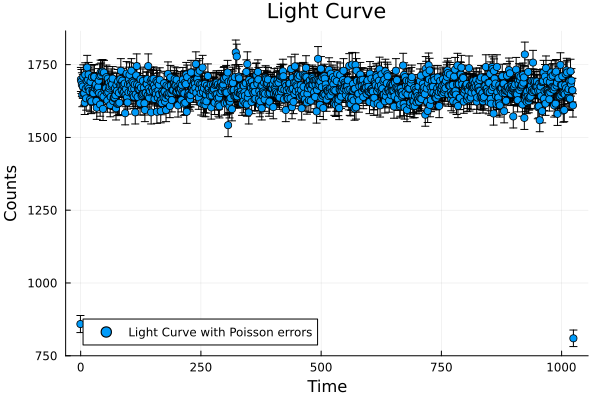

In [12]:
events = readevents("xmm_test.fits", mission="xmm")
plot(events, 1.0, show_gaps=false)

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 1000 events
[ Info: Using PI column for energy data
[ Info: Applying mission calibration for nustar
[ Info: Successfully loaded 1000 events from nomission.evt
[ Info: Energy data available: 1000 values, range: (1.6600000000000001, 42.5)


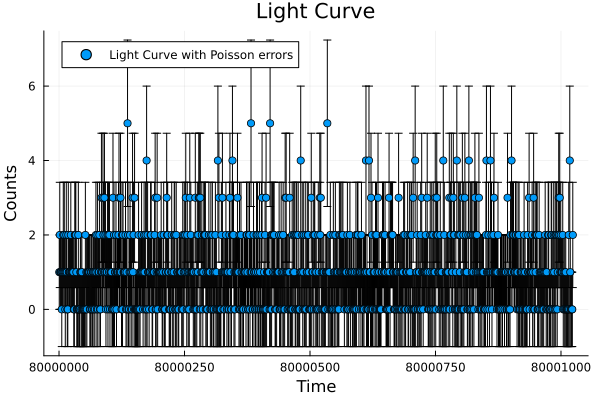

In [21]:
events1 = readevents("nomission.evt", mission="nustar")
plot(events1, 1.0, show_gaps=false)

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 1000 events
[ Info: Using PI column for energy data
[ Info: Applying mission calibration for nustar
[ Info: Successfully loaded 1000 events from monol_testA.evt
[ Info: Energy data available: 1000 values, range: (1.6600000000000001, 42.5)


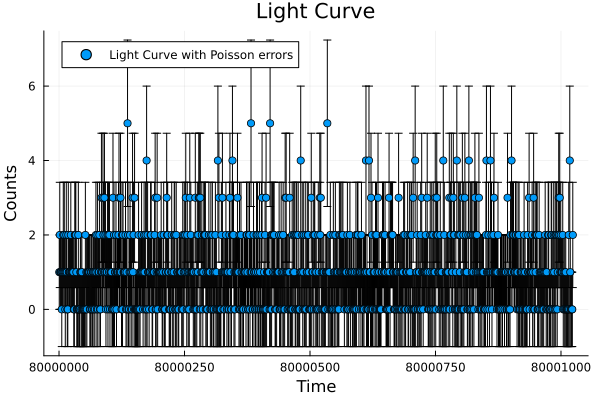

In [4]:
events3 = readevents("monol_testA.evt", mission="nustar")
plot(events3, 1.0, show_gaps=false)

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 1000 events
[ Info: Using ENERGY column for energy data
[ Info: Applying mission calibration for nustar
[ Info: Successfully loaded 1000 events from monol_testA_calib.evt
[ Info: Energy data available: 1000 values, range: (1.725599994659424, 3.3591999816894536)


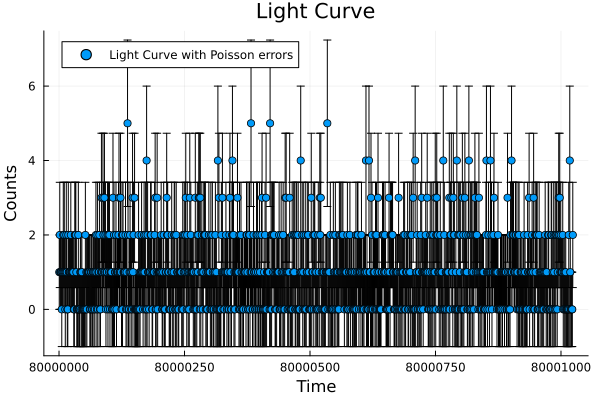

In [5]:
events2 = readevents("monol_testA_calib.evt", mission="nustar")
plot(events2, 1.0, show_gaps=false)

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 1000 events
[ Info: Using ENERGY column for energy data
[ Info: Applying mission calibration for nustar
[ Info: Successfully loaded 1000 events from monol_testA_calib_unsrt.evt
[ Info: Energy data available: 1000 values, range: (1.725599994659424, 3.3591999816894536)


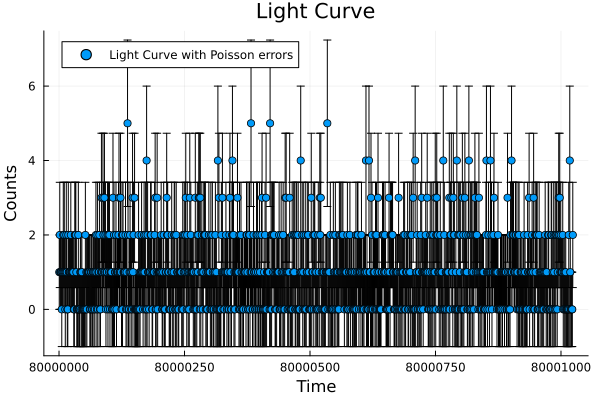

In [6]:
events4 = readevents("monol_testA_calib_unsrt.evt", mission="nustar")
plot(events4, 1.0, show_gaps=false)

In [ ]:
events5 = readevents("lcurve_new.fits", mission="nicer")
#i have tried by removing mission still doesnt plot
plot(events5, 1.0, show_gaps=false)#i dont why this falls in infinite loop while plotting

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 2000 events
[ Info: Successfully loaded 2000 events from lcurve_new.fits


[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 1026 events
[ Info: Successfully loaded 1026 events from lcurveA.fits


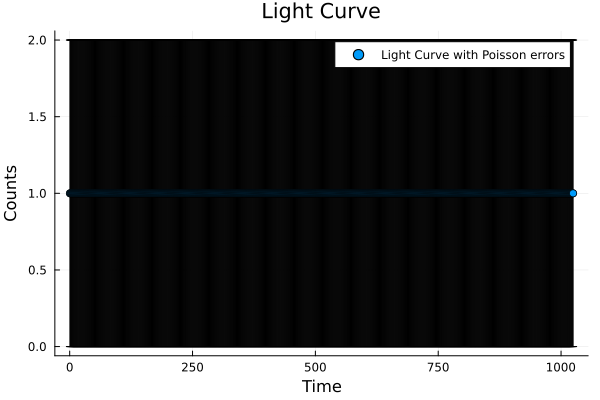

In [5]:
events6 = readevents("lcurveA.fits", mission="nicer")
plot(events6, 1.0, show_gaps=false)

In [7]:
events7 = readevents("bexvar_results_band_0.npy", mission="ixpe")
plot(events7, 1.0, show_gaps=false)#i guess this is the output of LightCurve_bexvar.fits syill leaving this to analize

LoadError: CFITSIO has encountered an error while processing bexvar_results_band_0.npy. Error code 252: 1st key not SIMPLE or XTENSION
Detailed error message follows: 
Extension doesn't start with SIMPLE or XTENSION keyword. (ffrhdu)
�NUMPY
ffopen could not interpret primary array header of file: 
bexvar_results_band_0.npy
This does not look like a FITS file.


In [ ]:
events8 = readevents("LightCurve_bexvar.fits", mission="ixpe")
plot(events8, 1.0, show_gaps=false)#this fall in an infinite loop or something i am guesing we need to work on bexvar seprately

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 3740 events
[ Info: Successfully loaded 3740 events from LightCurve_bexvar.fits


In [7]:
events9 = readevents("chandra_noener_test.fits", mission="axaf")
plot(events9, 1.0, show_gaps=false)

┌ Warning: No TIME column found in FITS file chandra_noener_test.fits
└ @ Main K:\notebooks_julia\1.jl:192
┌ Warning: Event list contains no time data. Cannot create light curve.
└ @ Main K:\notebooks_julia\1.jl:514


LoadError: ArgumentError: Event list is empty

In [10]:
events10 = readevents("chandra_test.fits", mission="axaf")
plot(events10, 1.0, show_gaps=false)

┌ Warning: No TIME column found in FITS file chandra_test.fits
└ @ Main K:\notebooks_julia\1.jl:192
┌ Warning: Event list contains no time data. Cannot create light curve.
└ @ Main K:\notebooks_julia\1.jl:514


LoadError: ArgumentError: Event list is empty

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 1000 events
[ Info: Using PHA column for energy data
[ Info: Successfully loaded 1000 events from xte_test.evt.gz
[ Info: Energy data available: 1000 values, range: (0.0, 60.0)


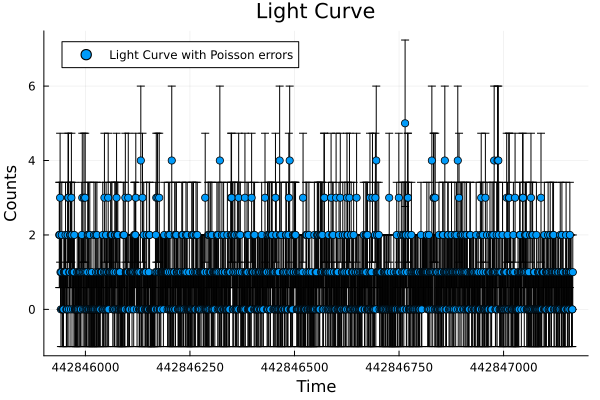

In [11]:
events11 = readevents("xte_test.evt.gz")
plot(events11, 1.0, show_gaps=false)

[ Info: Found event HDU with TIME column in HDU 2
[ Info: Processing 3518 events
[ Info: Using PHA column for energy data
[ Info: Successfully loaded 3518 events from xte_gx_test.evt.gz
[ Info: Energy data available: 3518 values, range: (2.0, 255.0)


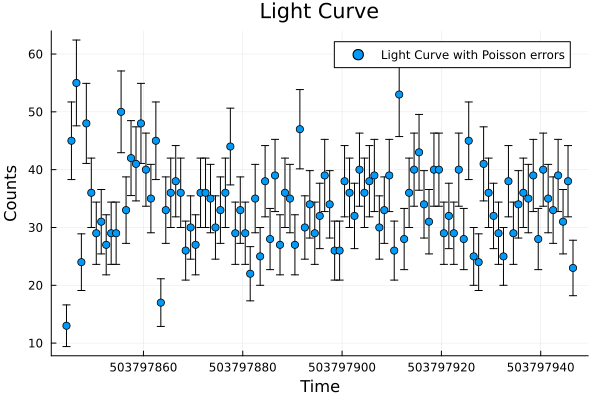

In [12]:
events12 = readevents("xte_gx_test.evt.gz")
plot(events12, 1.0, show_gaps=false)

In [13]:
events13 = readevents("test.rmf")
plot(events13, 1.0, show_gaps=false)

┌ Warning: No TIME column found in FITS file test.rmf
└ @ Main K:\notebooks_julia\1.jl:192
┌ Warning: Event list contains no time data. Cannot create light curve.
└ @ Main K:\notebooks_julia\1.jl:514


LoadError: ArgumentError: Event list is empty

In [14]:
events14 = readevents("sample_variable_series.fits")
plot(events14, 1.0, show_gaps=false)

┌ Warning: No TIME column found in FITS file sample_variable_series.fits
└ @ Main K:\notebooks_julia\1.jl:192
┌ Warning: Event list contains no time data. Cannot create light curve.
└ @ Main K:\notebooks_julia\1.jl:514


LoadError: ArgumentError: Event list is empty